In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import tensorflow as tf 
from tensorflow import keras
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Input, Conv2D, UpSampling2D, BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import cv2
import os 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import random

2023-01-17 09:02:32.624429: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-17 09:02:32.711876: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-01-17 09:02:32.714195: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-17 09:02:32.714205: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore 

In [2]:
os.listdir('wm-nowm/') # directory with the images (root)

['train', 'valid', '.checkpoint']

In [3]:
# directory paths 
train_path = 'wm-nowm/train' # training directory
valid_path = 'wm-nowm/valid' # validation directory

In [4]:
def takeFileName(filedir): # remove just file name from directory and return
    # filename = np.array(filedir.split('/'))[-1].split('.')[0] # take out the name, isolate the jpeg, then return the name
    filename = np.array(filedir.split('/'))[-1] # take out the name, then return the name
    # print(filename)
    return filename

In [5]:
def matchFileNames(watermarkedarr, nonwatermarkedarr, dname_wm, dname_nwm):
    sortedwmarr = np.array([])
    sortednwmarr = np.array([])
    
    wmarr = list(watermarkedarr)
    nwmarr = list(nonwatermarkedarr)
    
    length = len(watermarkedarr) if len(watermarkedarr) >= len(nonwatermarkedarr) else len(nonwatermarkedarr)
    
    for pos in range(length):
        try:
            if length == len(watermarkedarr): # more images in watermarked array
                exist_nwm = nwmarr.index(wmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[pos]) # this is the iterable
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[exist_nwm]) # this is the match
            elif length == len(nonwatermarkedarr): # more images in nonwatermarked array
                exist_wm = wmarr.index(nwmarr[pos])
                sortedwmarr = np.append(sortedwmarr, dname_wm + watermarkedarr[exist_wm]) # this is the match
                sortednwmarr = np.append(sortednwmarr, dname_nwm + nonwatermarkedarr[pos]) # this is the iterable
        except ValueError: 
            continue
    return sortedwmarr, sortednwmarr

In [6]:
# Sort the watermarked and non watermarked images into parallel arrays so NN will use it better

train_path_watermarked_images = 'wm-nowm/train/watermark/'
train_path_nonwatermarked_images = 'wm-nowm/train/no-watermark/'

tp_watermarked = np.array([]) # array with watermarked image names
tp_nonwatermarked = np.array([]) # array with nonwatermarked image names

for root, dirs, files in os.walk(train_path_watermarked_images, topdown=True): # data length = 12510
    for file in files:
        tp_watermarked = np.append(tp_watermarked, takeFileName(file)) # append just the name of the file into array
    
for root, dirs, files in os.walk(train_path_nonwatermarked_images, topdown=True): # data length = 12477
    for file in files:
        tp_nonwatermarked = np.append(tp_nonwatermarked, takeFileName(file)) # append just the name of the file into array
        
tp_watermarked_sorted, tp_nonwatermarked_sorted = matchFileNames(tp_watermarked, tp_nonwatermarked, train_path_watermarked_images, train_path_nonwatermarked_images)


valid_path_watermarked_images = 'wm-nowm/valid/watermark/'
valid_path_nonwatermarked_images = 'wm-nowm/valid/no-watermark/'

vp_watermarked = np.array([]) # array with watermarked image names
vp_nonwatermarked = np.array([]) # array with nonwatermarked image names

for root, dirs, files in os.walk(valid_path_watermarked_images, topdown=True): # data length = 3299
    for file in files:
        vp_watermarked = np.append(vp_watermarked, takeFileName(file)) # append just the name of the file into array
    
for root, dirs, files in os.walk(valid_path_nonwatermarked_images, topdown=True): # data length = 3289
    for file in files:
        vp_nonwatermarked = np.append(vp_nonwatermarked, takeFileName(file)) # append just the name of the file into array
        
vp_watermarked_sorted, vp_nonwatermarked_sorted = matchFileNames(vp_watermarked, vp_nonwatermarked, valid_path_watermarked_images, valid_path_nonwatermarked_images)

In [7]:
# dimension to resize to 
width = 196 # only certain dimensions work due to UpSampling (196x196 works, 148x148 works)
height = 196
dim = (width, height) # set the dimensions

def createPixelArr(files):
    data = []
    for image in files:
        try: # take each image and use imread to get the pixel values in a matrix 
            img_arr = cv2.imread(image, cv2.IMREAD_COLOR)
            resized_arr = cv2.resize(img_arr, (width, height)) # rescale the image so every image is of the same dimension
            data.append(resized_arr) # add the matrix of pixel values 
        except Exception as e:
            print(e) # some error thrown in imread or resize
    return np.array(data)

train_wms_pixVals = createPixelArr(tp_watermarked_sorted)
train_nwms_pixVals = createPixelArr(tp_nonwatermarked_sorted)

val_wms_pixVals = createPixelArr(vp_watermarked_sorted)
val_nwms_pixVals = createPixelArr(vp_nonwatermarked_sorted) # make ndarrays

In [8]:
train_wms_pixVals.shape

(1743, 196, 196, 3)

In [9]:
tp_watermarked_sorted

array(['wm-nowm/train/watermark/pexels-photo-808466.jpeg',
       'wm-nowm/train/watermark/pexels-photo-3889986.jpeg',
       'wm-nowm/train/watermark/pexels-photo-594610.jpeg', ...,
       'wm-nowm/train/watermark/pexels-photo-3274988.jpeg',
       'wm-nowm/train/watermark/pexels-photo-4558539.jpeg',
       'wm-nowm/train/watermark/pexels-photo-1181346.jpeg'], dtype='<U79')

In [10]:
# TODO use sklearn to split tp_wms_pixVals, tp_nwms_pixVals into training and testing sets
# use variables names: X_train, y_train, X_test, y_test
# 80% training, 20% testing, amount of shuffling applied
X_train, X_test, y_train, y_test = train_test_split(train_wms_pixVals, train_nwms_pixVals, train_size=0.8, random_state=1) 

In [11]:
train_wms_pixVals = 0 
train_nwms_pixVals = 0 
val_wms_pixVals = 0 
val_nwms_pixVals = 0 

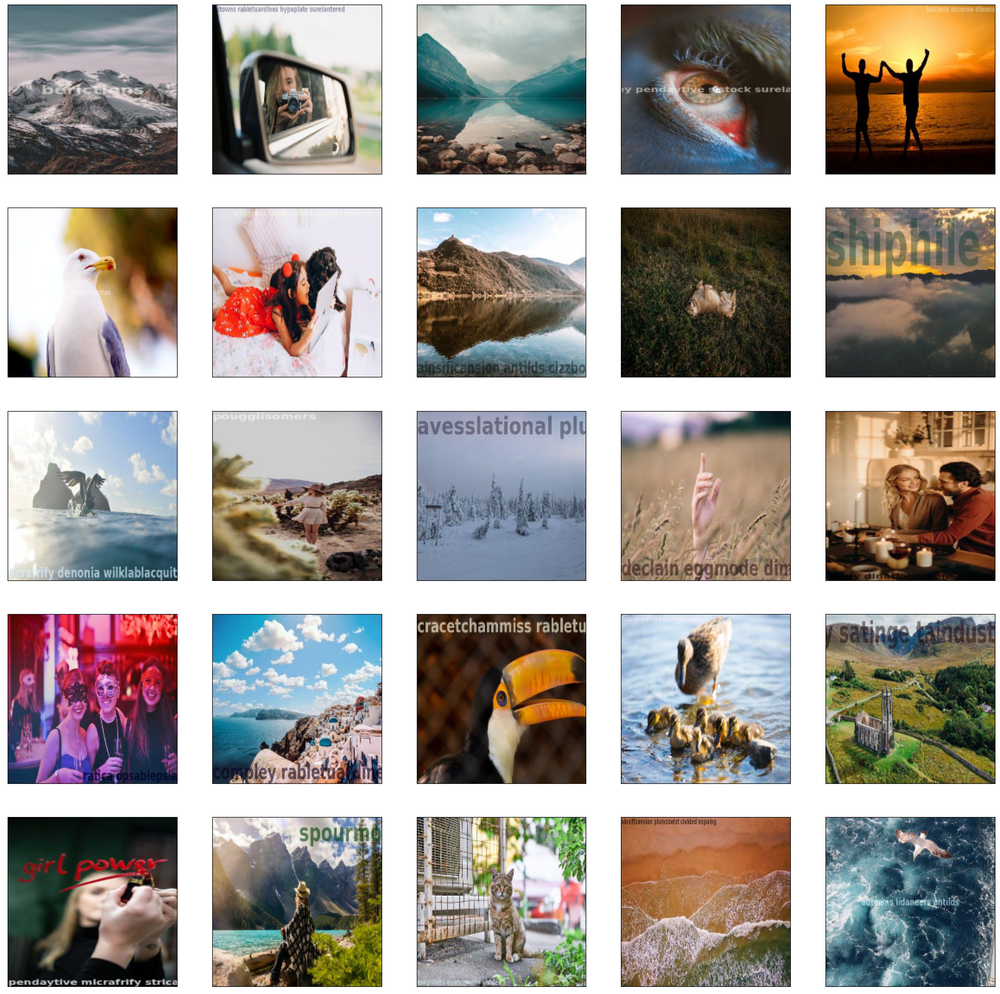

In [12]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB))
plt.show()

In [13]:
# Functions to data augment images 

def data_augmentation(inputImage): # run image through all augmentation methods
    return randomContrast(randomBrightness(inputImage)).numpy()
    # return randomCrop(randomFlip(inputImage)) # use augmentation methods without messing with colour 

def randomFlip(pic): # flips the image up and down before left and right at random
    return tf.image.random_flip_up_down(tf.image.random_flip_left_right(pic, 1), 1)

# def randomCrop(pic): # crops the image from a randomly defined width and height, that are under the intial image width and height
#     return tf.image.random_crop(pic, size=[random.randint(75,width), random.randint(75,height), 3], seed=None)

def randomBrightness(pic): # makes the image a random brightness from 1% to 20%
    return tf.image.random_brightness(pic, random.uniform(0.01, 0.2), 1)

def randomContrast(pic): # contrasts the image from 5% to 50%
    return tf.image.random_contrast(pic, 0.2, 0.7, 1)

2023-01-17 09:03:29.677635: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/aldar/anaconda3/lib/python3.9/site-packages/cv2/../../lib64:
2023-01-17 09:03:29.677653: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2023-01-17 09:03:29.677664: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (aldar-LAPKC71E): /proc/driver/nvidia/version does not exist
2023-01-17 09:03:29.677877: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow w

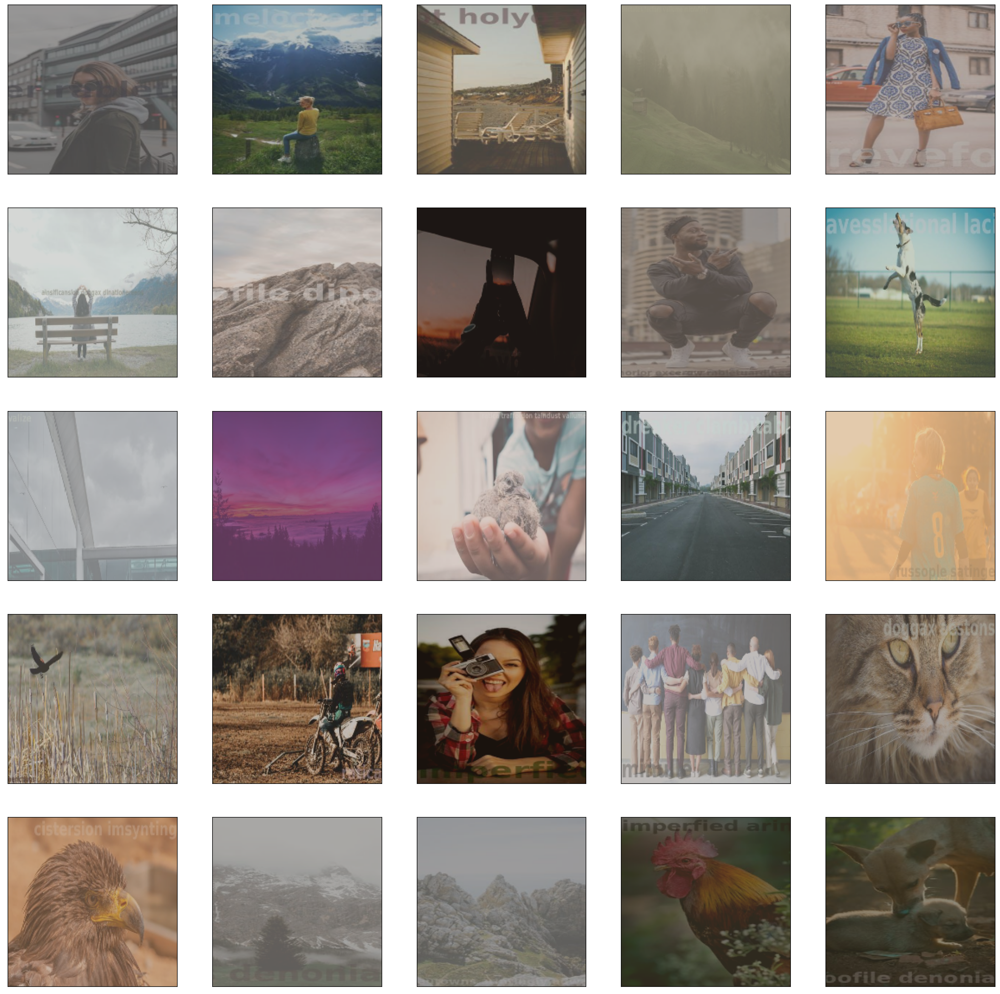

In [14]:
# Output Tensorflow data augmented images
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    augmented_image = data_augmentation(X_train[random.randint(1, len(X_train))]) # send 25 images into data augmentation
    plt.imshow(cv2.cvtColor(augmented_image, cv2.COLOR_BGR2RGB)) # not using cv2 as it messed up the code
plt.show()

In [15]:
#apply data augmentation to the X_train and y_train

data_augmented_X = [] 
data_augmented_y = []

for image in X_train:
    data_augmented_X.append(data_augmentation(image))
    
for image in y_train:
    data_augmented_y.append(data_augmentation(image))

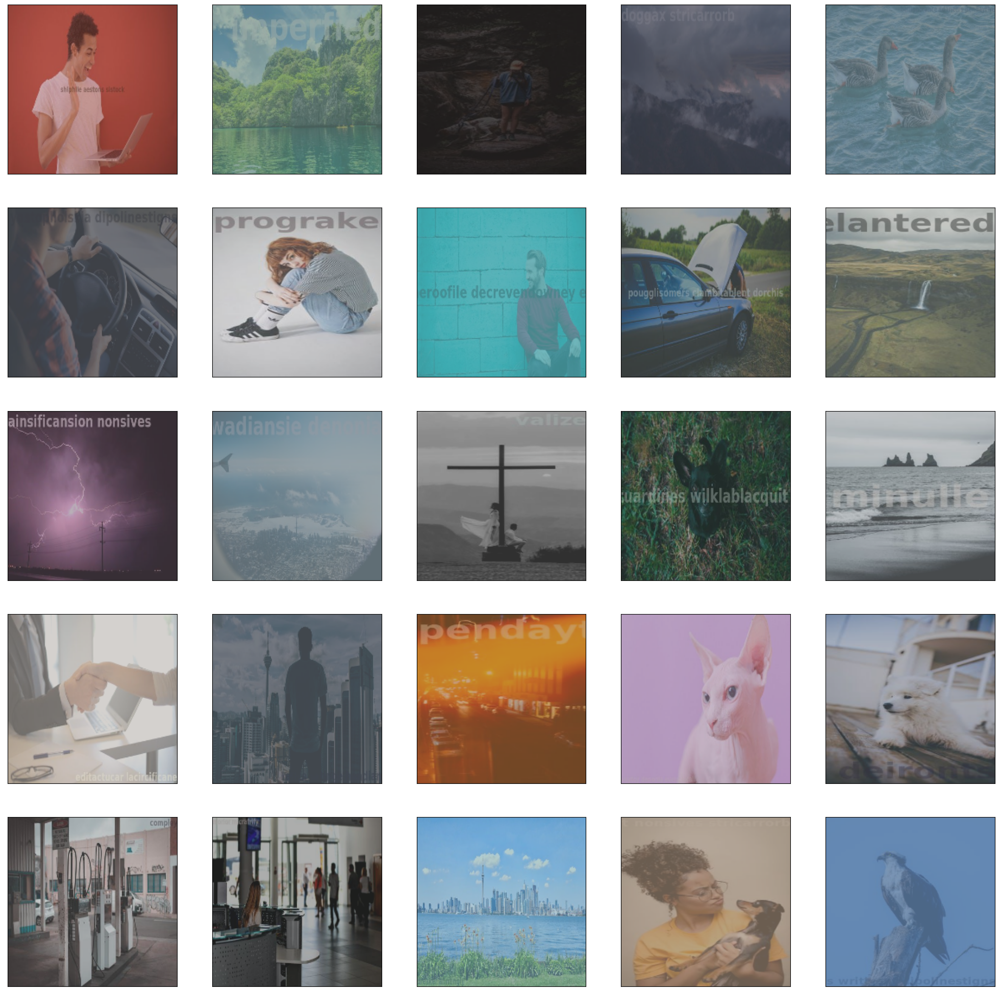

In [16]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_X[i], cv2.COLOR_BGR2RGB))
plt.show()

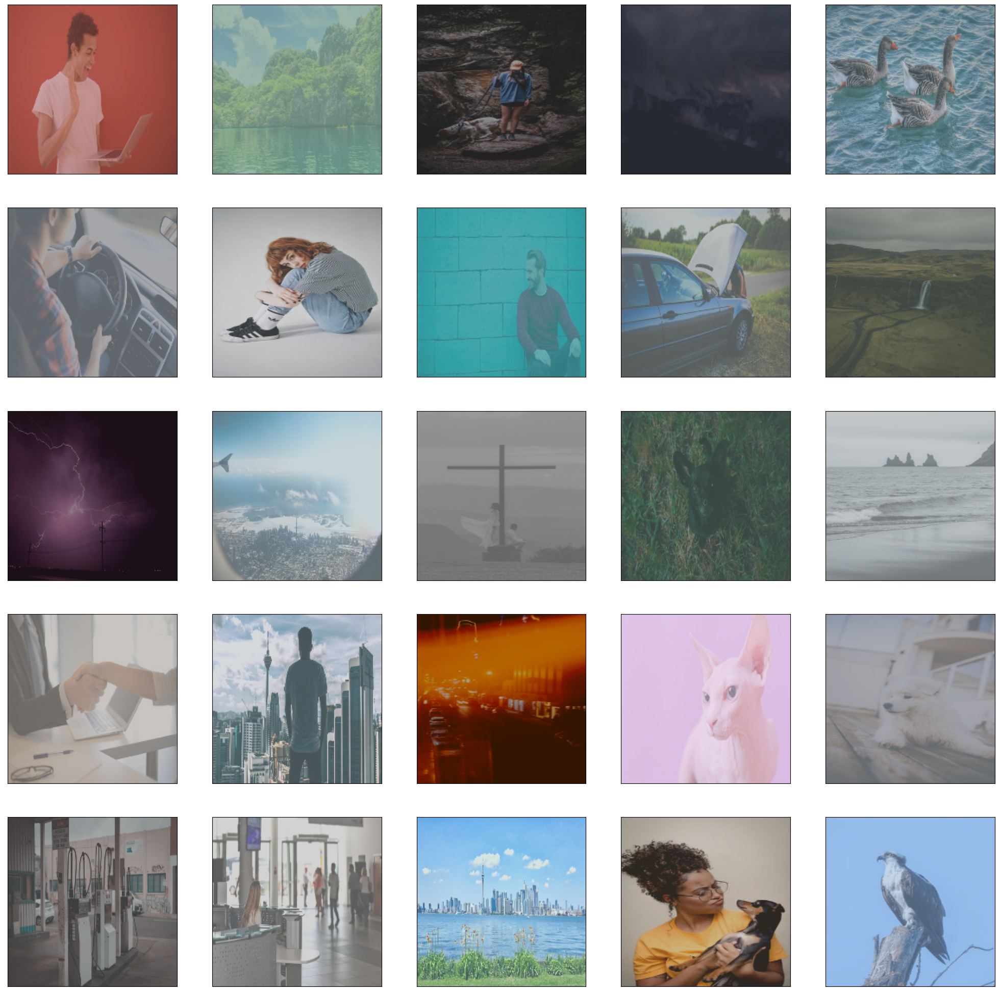

In [17]:
plt.figure(figsize=(25,25))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(cv2.cvtColor(data_augmented_y[i], cv2.COLOR_BGR2RGB))
plt.show()

In [18]:
X_train = np.append(X_train, data_augmented_X, axis=0)
y_train = np.append(y_train, data_augmented_y, axis=0)

In [22]:
data_augmented_X

[array([[[ 56,  66, 150],
         [ 57,  67, 150],
         [ 57,  67, 151],
         ...,
         [ 49,  58, 129],
         [ 48,  58, 129],
         [ 50,  59, 130]],
 
        [[ 56,  66, 150],
         [ 57,  67, 150],
         [ 57,  67, 151],
         ...,
         [ 50,  58, 129],
         [ 49,  57, 130],
         [ 50,  58, 131]],
 
        [[ 56,  66, 150],
         [ 57,  67, 150],
         [ 57,  67, 151],
         ...,
         [ 50,  58, 130],
         [ 50,  58, 130],
         [ 51,  59, 131]],
 
        ...,
 
        [[ 55,  66, 147],
         [ 56,  66, 147],
         [ 55,  65, 146],
         ...,
         [ 43,  51, 113],
         [ 43,  50, 113],
         [ 42,  49, 111]],
 
        [[ 54,  66, 146],
         [ 55,  65, 146],
         [ 55,  65, 144],
         ...,
         [ 43,  50, 113],
         [ 43,  50, 113],
         [ 42,  49, 111]],
 
        [[ 53,  65, 145],
         [ 55,  65, 145],
         [ 54,  64, 144],
         ...,
         [ 43,  50, 113],
  

In [21]:
# normalize 
X_train = X_train / 255
y_train = y_train / 255
X_test = X_test / 255
y_test = y_test / 255

In [22]:
# base model for removing 

def create_model(img_x, img_y):
    x = Input(shape=(img_x, img_y, 3))
    
    # Think this process as function composition in algebra 
    
    # Encoder - compresses the input into a latent representation
    e_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    pool1 = MaxPooling2D((2, 2), padding='same')(e_conv1)
    batchnorm_1 = BatchNormalization()(pool1)
    
    e_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(batchnorm_1)
    pool2 = MaxPooling2D((2, 2), padding='same')(e_conv2)
    batchnorm_2 = BatchNormalization()(pool2)
    
    e_conv3 = Conv2D(16, (3, 3), activation='relu', padding='same')(batchnorm_2)
    h = MaxPooling2D((2, 2), padding='same')(e_conv3)
    
    # Decoder - reconstructs the input from a latent representation 
    d_conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(h)
    up1 = UpSampling2D((2, 2))(d_conv1)
    
    d_conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    up2 = UpSampling2D((2, 2))(d_conv2)
    
    d_conv3 = Conv2D(16, (3, 3), activation='relu')(up2)
    up3 = UpSampling2D((2, 2))(d_conv3)
    
    r = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(up3)
    
    model = Model(x, r)
    model.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')
    return model

In [23]:
# watermark_auto_encoder = create_model(width, height)
# early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
# history = watermark_auto_encoder.fit(X_train, y_train, batch_size=20, epochs=100, callbacks=[early_stop])

Epoch 1/100
140/140 [==============================] - 42s 297ms/step - loss: 0.0199
Epoch 2/100
140/140 [==============================] - 42s 302ms/step - loss: 0.0147
Epoch 3/100
140/140 [==============================] - 43s 306ms/step - loss: 0.0136
Epoch 4/100
140/140 [==============================] - 46s 328ms/step - loss: 0.0133
Epoch 5/100
140/140 [==============================] - 41s 293ms/step - loss: 0.0125
Epoch 6/100
140/140 [==============================] - 43s 309ms/step - loss: 0.0128
Epoch 7/100
140/140 [==============================] - 50s 355ms/step - loss: 0.0124
Epoch 8/100
140/140 [==============================] - 48s 340ms/step - loss: 0.0120
Epoch 9/100
140/140 [==============================] - 42s 299ms/step - loss: 0.0122
Epoch 10/100
140/140 [==============================] - 42s 298ms/step - loss: 0.0115
Epoch 11/100
140/140 [==============================] - 42s 299ms/step - loss: 0.0118
Epoch 12/100
140/140 [==============================] - 42s 298

In [25]:
#watermark_auto_encoder.save("my_model")

INFO:tensorflow:Assets written to: my_model/assets


INFO:tensorflow:Assets written to: my_model/assets
